### Inspect Dataset

In [2]:
import os

base_input_folder = "/kaggle/input/brain-tumor-mri"

classes = sorted(os.listdir(base_input_folder))
print("Classes found:", classes)

for c in classes:
    class_path = os.path.join(base_input_folder, c)
    num_images = len([f for f in os.listdir(class_path) if f.lower().endswith(('.jpg','.png','.jpeg'))])
    print(f"{c}: {num_images} slices")


Classes found: ['Astrocitoma T1', 'Astrocitoma T1C+', 'Astrocitoma T2', 'Carcinoma T1', 'Carcinoma T1C+', 'Carcinoma T2', 'Ependimoma T1', 'Ependimoma T1C+', 'Ependimoma T2', 'Ganglioglioma T1', 'Ganglioglioma T1C+', 'Ganglioglioma T2', 'Germinoma T1', 'Germinoma T1C+', 'Germinoma T2', 'Glioblastoma T1', 'Glioblastoma T1C+', 'Glioblastoma T2', 'Granuloma T1', 'Granuloma T1C+', 'Granuloma T2', 'Meduloblastoma T1', 'Meduloblastoma T1C+', 'Meduloblastoma T2', 'Meningioma T1', 'Meningioma T1C+', 'Meningioma T2', 'Neurocitoma T1', 'Neurocitoma T1C+', 'Neurocitoma T2', 'Oligodendroglioma T1', 'Oligodendroglioma T1C+', 'Oligodendroglioma T2', 'Papiloma T1', 'Papiloma T1C+', 'Papiloma T2', 'Schwannoma T1', 'Schwannoma T1C+', 'Schwannoma T2', 'Tuberculoma T1', 'Tuberculoma T1C+', 'Tuberculoma T2', '_NORMAL T1', '_NORMAL T2']
Astrocitoma T1: 176 slices
Astrocitoma T1C+: 232 slices
Astrocitoma T2: 171 slices
Carcinoma T1: 66 slices
Carcinoma T1C+: 112 slices
Carcinoma T2: 73 slices
Ependimoma T1:

### Showing samples

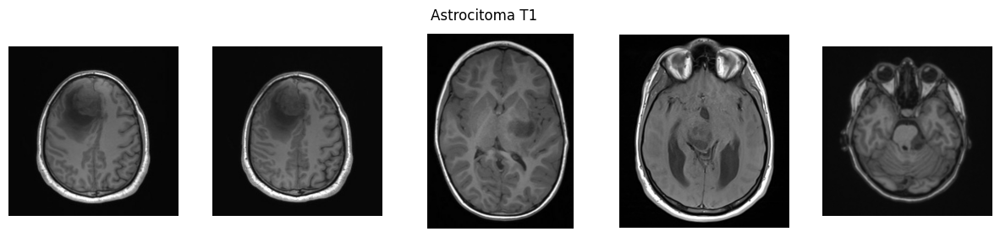

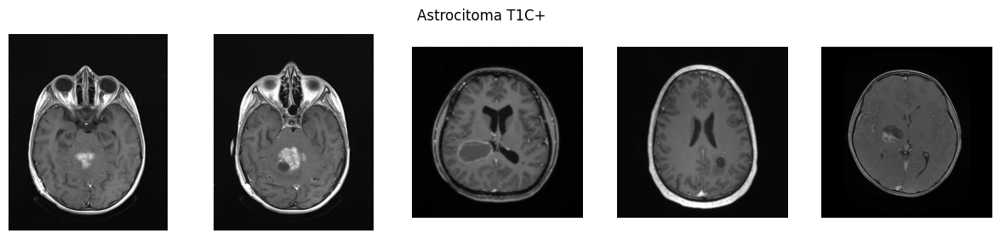

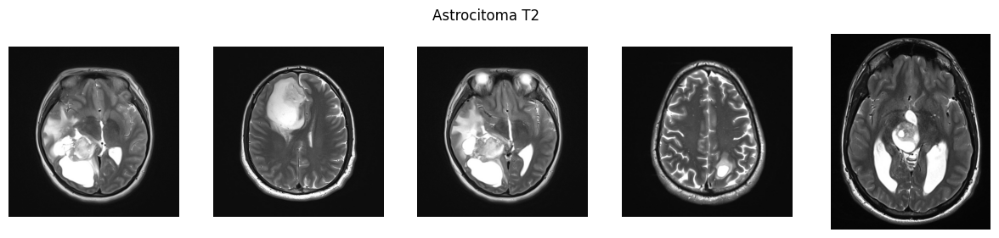

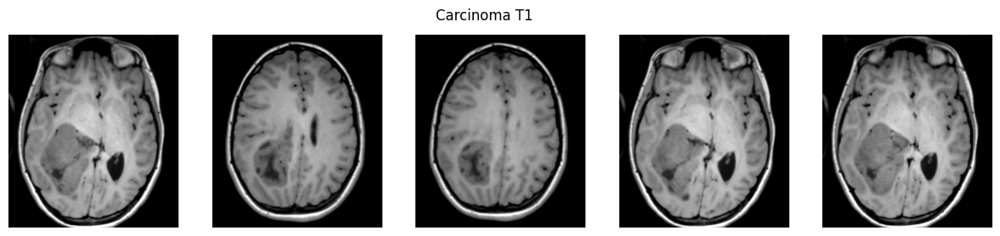

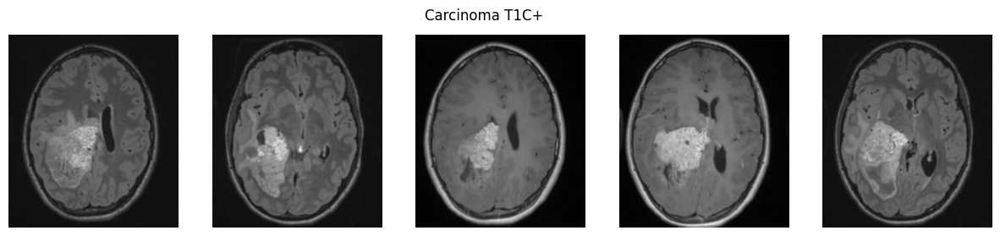

...

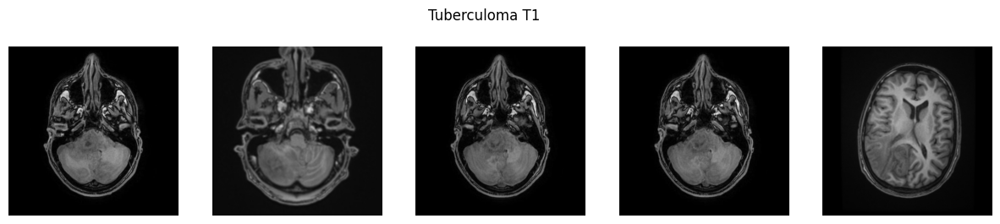

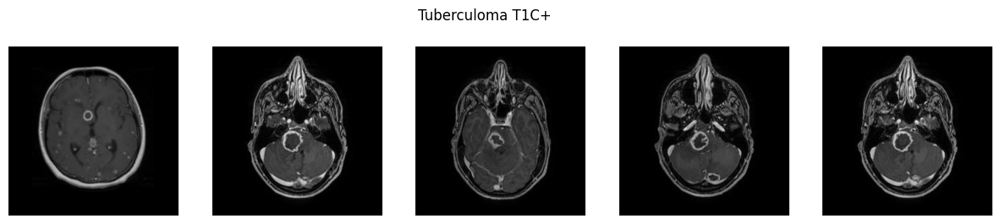

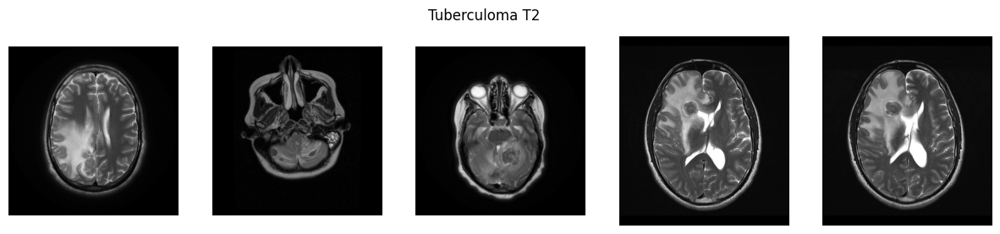

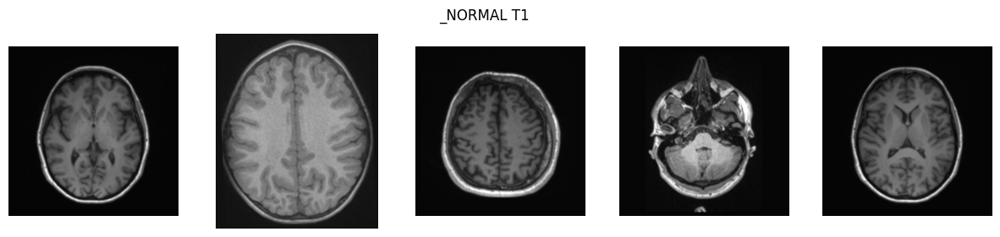

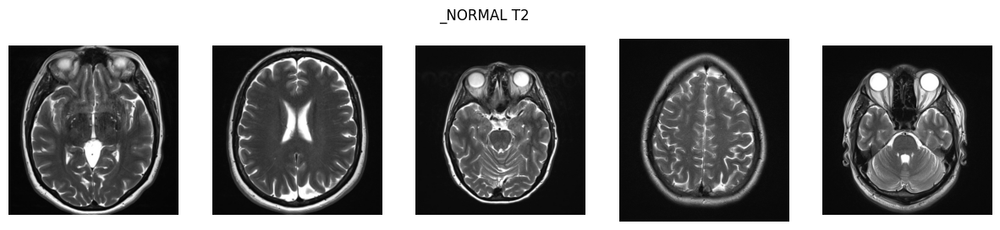

In [3]:
import os
import matplotlib.pyplot as plt
import random
import cv2

base_input_folder = "/kaggle/input/brain-tumor-mri"
classes = sorted(os.listdir(base_input_folder))

for c in classes:
    class_path = os.path.join(base_input_folder, c)
    images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg','.png','.jpeg'))]
    sample_imgs = random.sample(images, min(5, len(images)))
    
    plt.figure(figsize=(15,3))
    for i, img_name in enumerate(sample_imgs):
        img = cv2.imread(os.path.join(class_path, img_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1,5,i+1)
        plt.imshow(img)
        plt.axis("off")
    plt.suptitle(c)
    plt.show()

### Investigating Images

Unique resolutions: {(522, 630), (533, 630), (395, 498), (392, 511), (408, 464), (495, 630), (506, 630), (356, 444), (400, 478), (366, 476), (456, 540), (421, 528), (563, 630), (401, 479), (525, 630), (514, 630), (419, 459), (377, 471), (471, 524), (446, 589), (630, 517), (437, 540), (469, 572), (305, 348), (574, 630), (432, 546), (327, 362), (416, 547), (444, 538), (328, 354), (389, 459), (536, 630), (457, 584), (429, 513), (428, 557), (630, 512), (630, 521), (604, 630), (593, 630), (485, 539), (431, 540), (383, 500), (372, 509), (438, 463), (421, 630), (425, 511), (465, 574), (457, 579), (429, 517), (469, 553), (458, 571), (379, 516), (497, 517), (338, 353), (464, 587), (307, 356), (455, 538), (407, 461), (428, 520), (438, 570), (454, 514), (450, 562), (387, 524), (410, 498), (407, 447), (423, 562), (451, 630), (419, 551), (492, 630), (383, 485), (626, 630), (472, 572), (392, 472), (397, 505), (346, 432), (386, 486), (599, 630), (482, 630), (369, 442), (483, 549), (429, 578), (372, 4

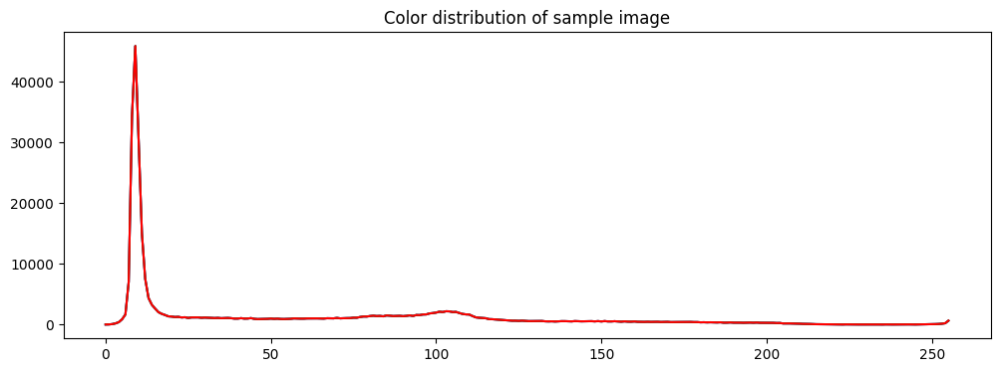

In [4]:
import cv2, os, matplotlib.pyplot as plt
import numpy as np

input_dir = "/kaggle/input/brain-tumor-mri"

resolutions, aspect_ratios = [], []

for cls in os.listdir(input_dir):
    cls_path = os.path.join(input_dir, cls)
    if not os.path.isdir(cls_path): continue
    for f in os.listdir(cls_path):
        if not f.lower().endswith(('.jpg','.jpeg','.png')): continue
        img = cv2.imread(os.path.join(cls_path, f))
        h, w = img.shape[:2]
        resolutions.append((w,h))
        aspect_ratios.append(round(w/h, 2))

# summary
print("Unique resolutions:", set(resolutions))
print("Aspect ratio stats: min =", min(aspect_ratios), 
      "max =", max(aspect_ratios), 
      "mean =", round(np.mean(aspect_ratios),2))

# color distribution on one sample
sample_cls = os.listdir(input_dir)[0]
sample_img = os.listdir(os.path.join(input_dir, sample_cls))[0]
img = cv2.imread(os.path.join(input_dir, sample_cls, sample_img))

colors = ('b','g','r')
plt.figure(figsize=(12,4))
for i,col in enumerate(colors):
    hist = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(hist,color=col)
plt.title("Color distribution of sample image")
plt.show()